# Model evaluation against the test set:
#### This notebook tests the model against a withheld test set which is taken from seperate locations to the training and validation set.



In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
# imports
from pathlib import Path
import sys
BASE_PATH = Path.cwd().parent.parent
sys.path.append(str(BASE_PATH))
model_save_path = BASE_PATH / 'models'
import pandas as pd
import opensoundscape as opso
from opensoundscape import audio
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from ipywidgets import interact
import glob
from src.utils import  show_samples_in_df, get_binary_targets_scores, suppress_warnings_if_main_branch, plot_metrics_across_thresholds, hawkears_files_to_df, plot_confusion_matrix, save_dataframe_clips_to_disk, show_sample_from_df, show_clip_from_multi_index_df, inspect_wrong_predictions

In [3]:
suppress_warnings_if_main_branch()

%load_ext autoreload
%autoreload 2

# Load the data

In [4]:
# load the test data
data_path = Path.cwd().parent.parent / "data"
test_df = pd.read_pickle(data_path / "interim" / "test_set" / "balanced_test_set_verified.pkl")

In [5]:
test_df.source.value_counts(dropna=False)

source
withheld-test-set        1000
SingleSpecies_all.csv     300
other-habitats-absent     300
Name: count, dtype: int64

for some datasets there are examples which need re-labelling. The function clean_confidence_cats will help with this:

In [6]:
def clean_confidence_cats(df, drop_unchecked=False):
    # Re-label the mis-labelled clips
    df.loc[df["confidence_cat"] == 5, "target_present"] = 1.0
    df.loc[df["confidence_cat"] == 6, "target_present"] = 0.0

    # drop the clips with confidence 1 or 2 since these were hard to label.
    df = df[df["confidence_cat"] != 1]
    df = df[df["confidence_cat"] != 2]
    if drop_unchecked:
        # Drop the unverified clips
        df = df[df["confidence_cat"] != 0]
    return df

In [7]:
test_df = clean_confidence_cats(test_df)
test_ds = test_df[["target_present"]]

In [8]:
# This dataset remains unchanged after cleaning
test_df.target_present.value_counts()

target_present
1.0    800
0.0    800
Name: count, dtype: int64

# Load a saved model

In [63]:
model = opso.load_model(model_save_path / "OSFL.model")

# Make predictions with the model

In [64]:
predictions = model.predict(test_ds, batch_size=64, num_workers=0, activation_layer='sigmoid')

  0%|          | 0/25 [00:00<?, ?it/s]

In [65]:
test_df['predicted'] = predictions.target_present

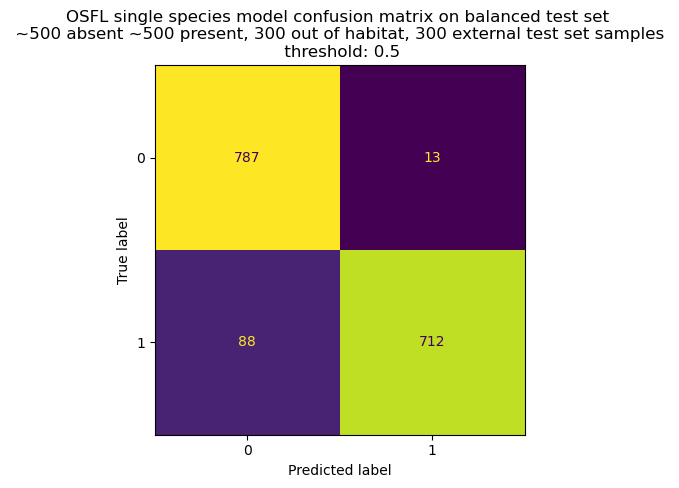

interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0, step=0.01), Output()), _dom_cla…

<function __main__.interactive_confusion_matrix(threshold=0.5)>

In [66]:
title = "OSFL single species model confusion matrix on balanced test set \n ~500 absent ~500 present, 300 out of habitat, 300 external test set samples"
cm = plot_confusion_matrix(test_df,predictions,threshold=0.5, title=title)
def interactive_confusion_matrix(threshold=0.5):
    cm = plot_confusion_matrix(test_df,predictions,threshold=threshold, title=title)
interact(interactive_confusion_matrix, threshold=(0,1,0.01))

# Plot metrics across thresholds

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


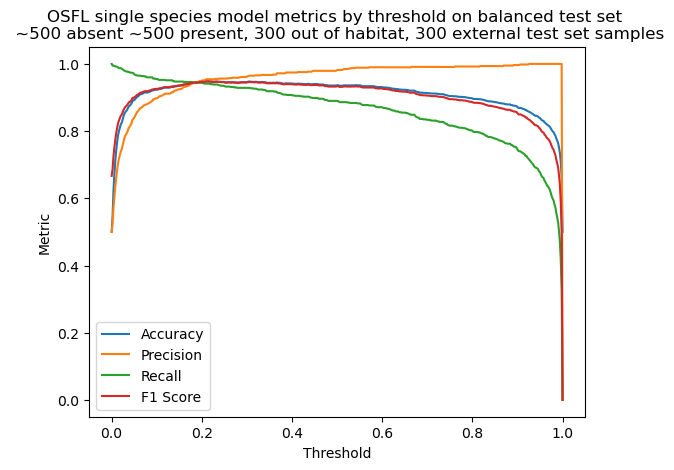

In [67]:
title = "OSFL single species model metrics by threshold on balanced test set \n ~500 absent ~500 present, 300 out of habitat, 300 external test set samples"
data, names = plot_metrics_across_thresholds(test_df, 'predicted', 'target_present', title = title)

In [68]:
# Find which threshold has highest F1 score
names.insert(0, 'threshold')
df = pd.DataFrame(data,columns=[names])
df.loc[df["F1 Score"].idxmax()]

,threshold,Accuracy,Precision,Recall,F1 Score
105,tensor(0.2104),0.948125,0.954373,0.94125,0.947766


In [69]:
thresh = df.loc[df["F1 Score"].idxmax()].threshold.values[0][0].item()

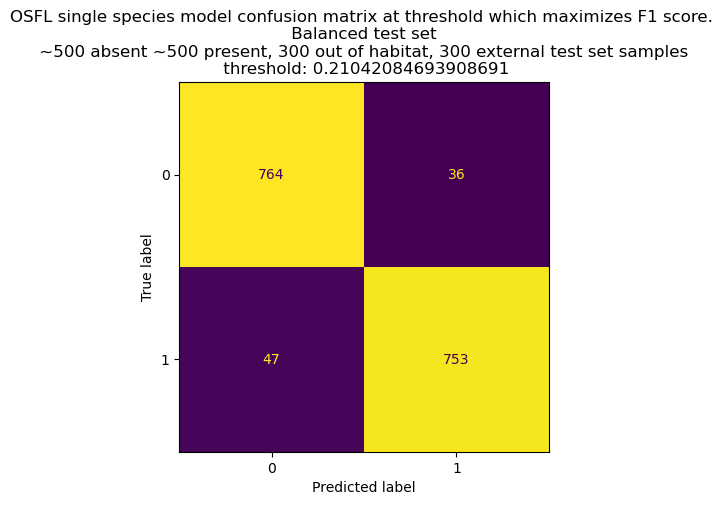

In [71]:
title="OSFL single species model confusion matrix at threshold which maximizes F1 score. \n Balanced test set \n ~500 absent ~500 present, 300 out of habitat, 300 external test set samples"
cm = plot_confusion_matrix(test_df,predictions,threshold=thresh, title=title)

# Collect the false negatives and false postitves

In [26]:
print(f"Threshold at best F1 score: {thresh}")
if Path.exists(data_path / "interim" / "test_set" / "false_positive_comments.pkl"):
    false_positives = pd.read_pickle(data_path / "interim" / "test_set" / "false_positive_comments.pkl")
else:
    false_positives = test_df.loc[test_df['predicted'] > thresh].loc[test_df['target_present'] == 0.0]
if Path.exists(data_path / "interim" / "test_set" / "false_negative_comments.pkl"):
    false_negatives = pd.read_pickle(data_path / "interim" / "test_set" / "false_negative_comments.pkl")
else:
    false_negatives = test_df.loc[test_df['predicted'] < thresh].loc[test_df['target_present'] == 1.0]
len(false_positives), len(false_negatives)

Threshold at best F1 score: 0.21042084693908691


(36, 47)

# Examine the false negatives
This is a sample of the examples which our model missed when used at the optimal threshold
The spectrograms have gone through the same model preprocessor as they would during training and inference, which involves a re-scaling to 224x224 pixels. 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


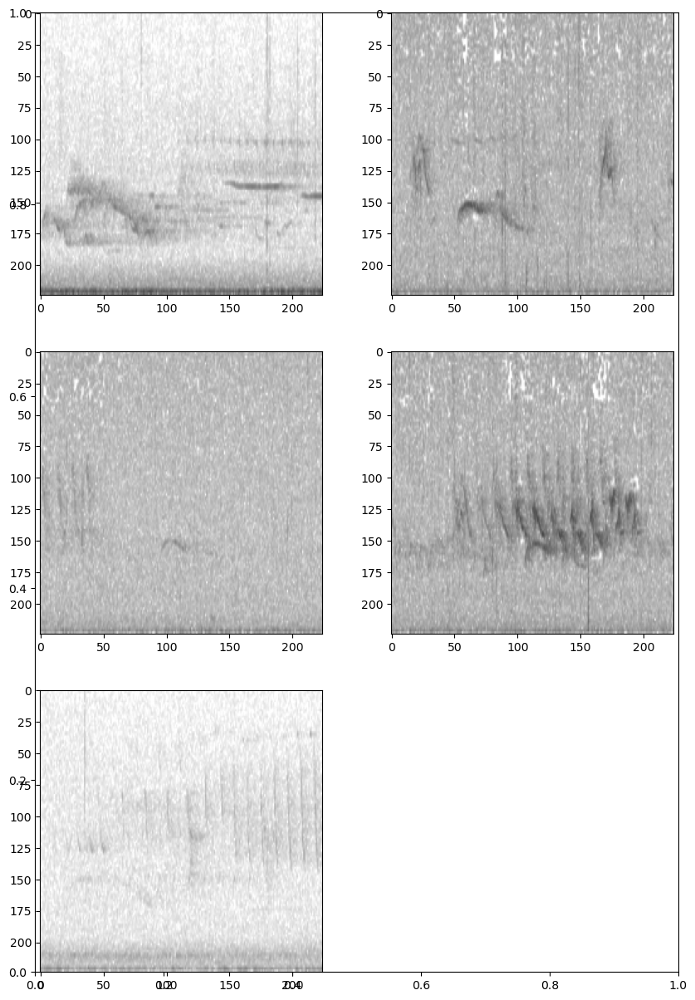

In [27]:
show_samples_in_df(false_negatives.sample(5), model)

All comments have been added, showing a sample.


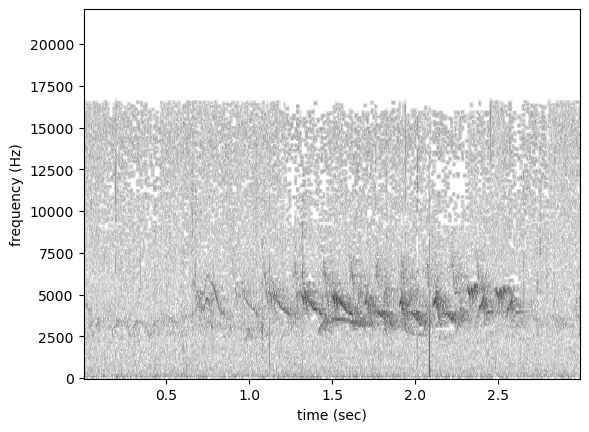

Comment: masked


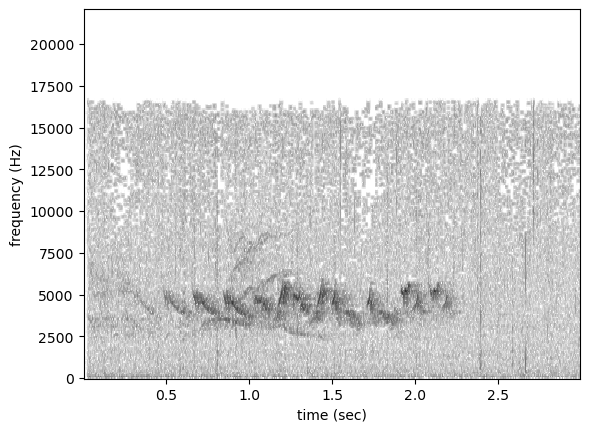

Comment: rain, masked


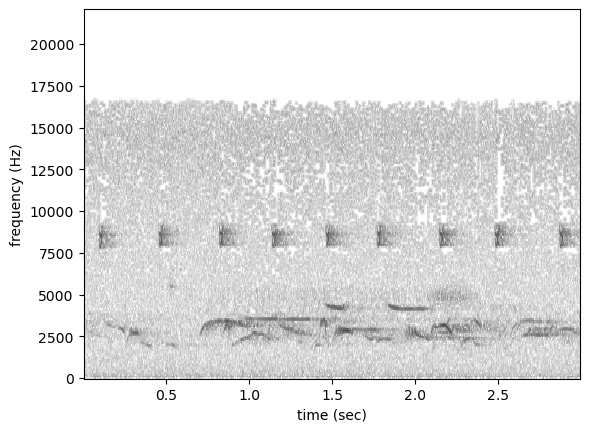

Comment: masked


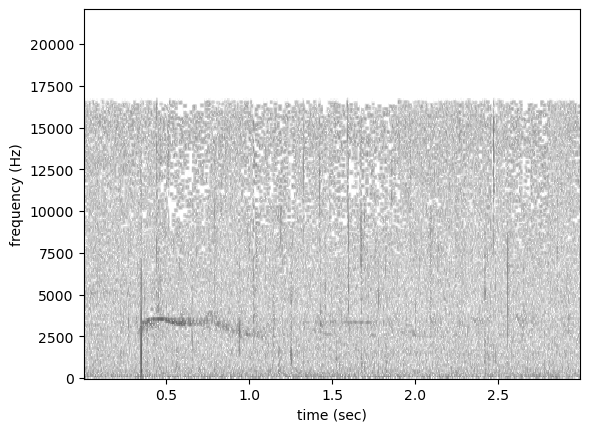

Comment: rain


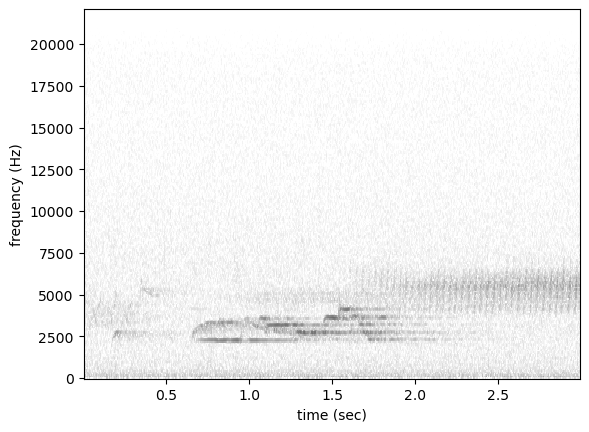

Comment: masked


In [28]:
inspect_wrong_predictions(false_negatives, "false_negative_comments")

In [29]:
false_negatives.false_negative_description.value_counts()

AttributeError: 'DataFrame' object has no attribute 'false_negative_description'

# Examine the false positives
This is a sample from the negative examples which our model returned as positive when set to the optimal threshold for this dataset. 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


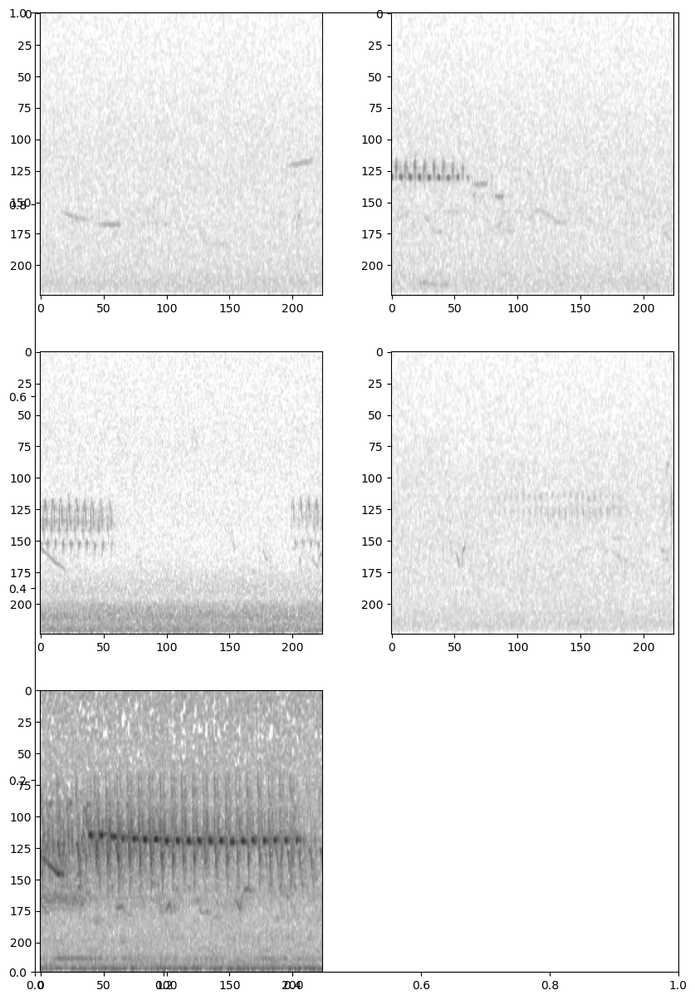

In [ ]:
show_samples_in_df(false_positives.sample(5), model)

In [ ]:
false_positives.columns

Index(['recording_url', 'task_method', 'project', 'detection_time',
       'tag_duration', 'latitude', 'longitude', 'file_type', 'media_url',
       'individual_order', 'location_id', 'filename', 'target_present',
       'target_absent', 'predicted', 'loss', 'confidence_cat', 'source',
       'organization', 'project_id', 'location', 'location_buffer_m',
       'equipment_make', 'equipment_model', 'recording_id',
       'recording_date_time', 'task_id', 'aru_task_status', 'task_duration',
       'species_code', 'species_common_name', 'species_scientific_name',
       'tag_id', 'individual_count', 'vocalization', 'rms_peak_dbfs',
       'tag_is_verified', 'tag_rating', 'observer', 'observer_id',
       'species_individual_comments', 'task_comments', 'wildtrax_url',
       'target', 'path', 'prediction', 'false_positive_comments',
       'false_positive_description'],
      dtype='object')

All comments have been added, showing a sample.


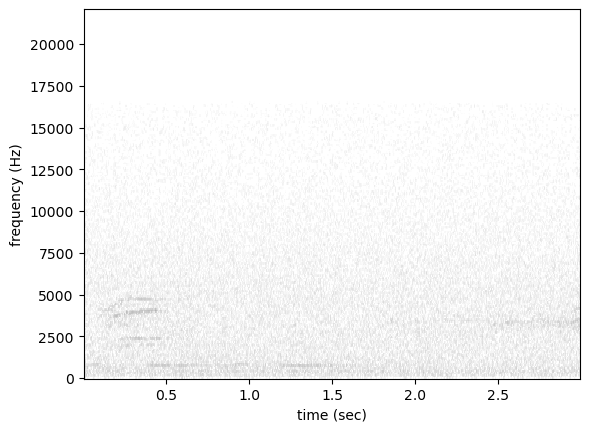

Comment: other species


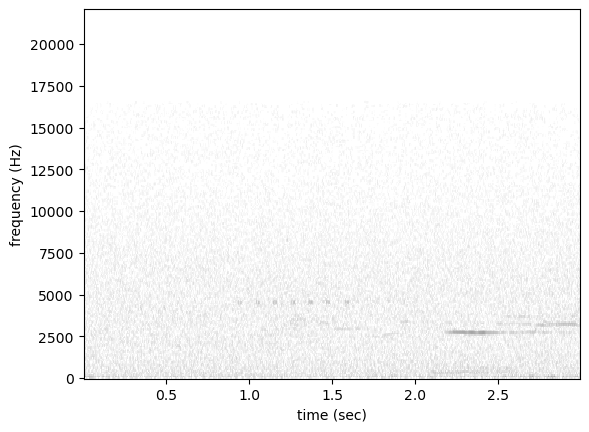

Comment: other species


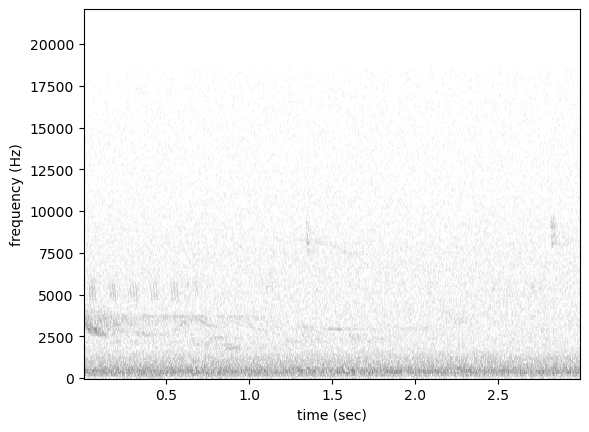

Comment: other species similar shape


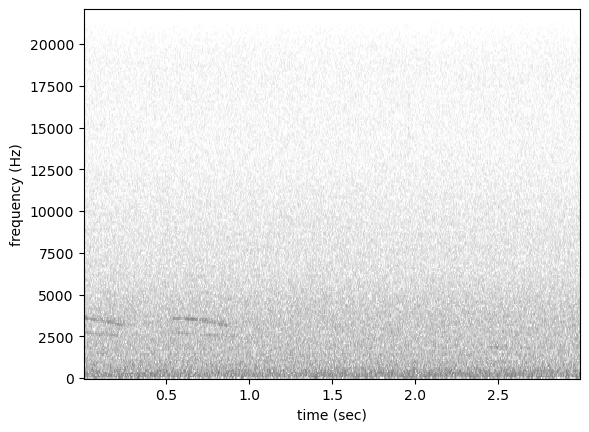

Comment: descending note and background noise


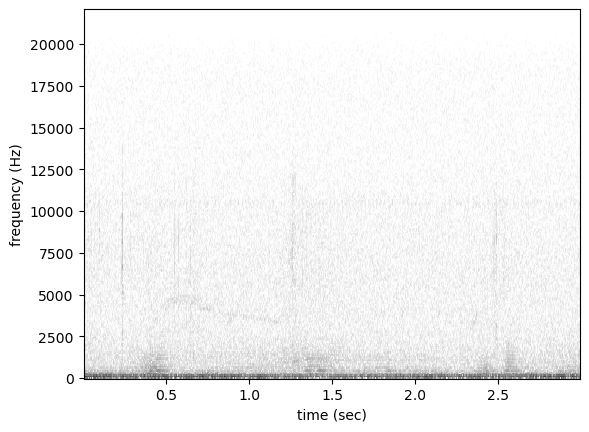

Comment: similar species to osfl


In [30]:
inspect_wrong_predictions(false_positives, comments_col_name="false_positive_comments")

In [31]:
false_positives.to_pickle(data_path / "interim" / "test_set" / "false_positive_comments.pkl")
false_negatives.to_pickle(data_path / "interim" / "test_set" / "false_negative_comments.pkl")

In [32]:
false_positives.false_positive_comments.value_counts()

false_positive_comments
other species                                                          6
descending tail note                                                   3
similar song shape descending tail note                                3
osfl present                                                           2
 different bird but has a similar shape to osfl in part of its song    1
faint birdsong masked by water or noise                                1
similar species to osfl                                                1
descending tail note and other species present                         1
other species, noise                                                   1
complex songs                                                          1
descending note and background noise                                   1
machine noise other speceis                                            1
other species                                                          1
other speices              

# Other habitat audio
We made a dataset of audio from outside the target species habitat. We can use this to get an idea of how many additional false positives are likely to show up if the model is used in new areas.

Make predictions on a set of samples from outside the target habitat

In [33]:
other_habitats = test_df.loc[test_df["source"] == 'other-habitats-absent']

other_habitats_preds = model.predict(other_habitats[["target_present"]], batch_size=64, num_workers=0, activation_layer='sigmoid')

  0%|          | 0/5 [00:00<?, ?it/s]

In [34]:
sum(other_habitats_preds.target_present < 0.8), sum(other_habitats_preds.target_present < 0.5)

(298, 297)

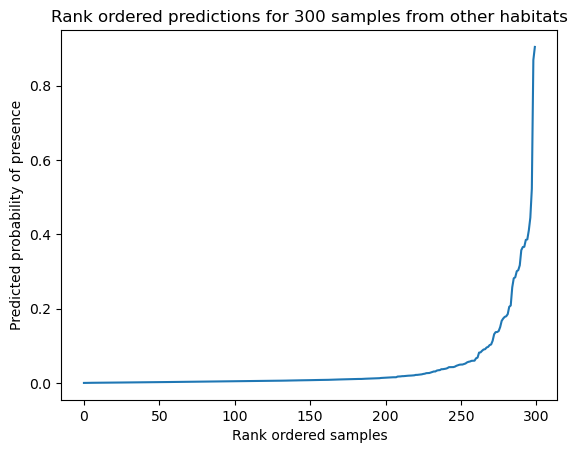

In [36]:
# Show the distribution of the 300 predictions. 
plt.plot(sorted(other_habitats_preds.target_present.values))
plt.title("Rank ordered predictions for 300 samples from other habitats")
plt.xlabel("Rank ordered samples")
plt.ylabel("Predicted probability of presence")
plt.show()

The number of false positives found in the other habitats recordings is promising, especially since half of the values in this data set are intentionally picked from the highest errors returned by a previous model.

# Compare with other existing models
#### To make a direct comparison between models, we need to measure the models predictions on the same test sets. 

To compare the models with others such as Birdnet, HawkEars, Perch etc, we can export the 3 second segments of audio to disk then get the model predictions on these clips. Then we can load these predictions and compare directly with the predictions our model made on those same audio clips. 

# To make hawkears predictions on each clip in the test set:
1. Enumerate the clips in the dataset for easier file naming
2. Make the save paths to save the audio to
3. Save the clips to disk
4. Run hawkears on the clips and output to the folder specified by __predictions path__ 
5. Load the predictions ready for processing the metrics

# Ennumerate each clip in the dataset

In [37]:
# Add an integer index to the training set to use as a file ID
test_df["file_id"] = 0
test_df.loc[:, 'file_id'] = range(0, len(test_df))
test_df.loc[:, 'file_id'] = test_df['file_id'].astype(int)

Create the save path or load previously saved test set from that path.

In [38]:
# Make a path to save the training set clips to
save_path = data_path / "processed" / "test_set" / "clips"
Path.mkdir(save_path, exist_ok=True, parents=True)

# Save the metadata in the same place or load it if there is already a saved version
if Path.exists(save_path.parent / "test_set.pkl"):
    test_df = pd.read_pickle(save_path.parent / "test_set.pkl")
    print("loading existing metadata")
else: 
    save_dataframe_clips_to_disk(test_df, save_path)
    test_df.to_pickle(save_path.parent / "test_set.pkl")
    print("saving metadata")

loading existing metadata


In [39]:
save_dataframe_clips_to_disk(test_df, save_path)

Directory is not empty. Choose an empty save directory to save a new test set.


# Make predictions on these clips using an existing model then parse the results

Comparison could be made with BirdNet, Perch etc, but I've chosen to compare to HawkEars since I believe it to be the best available model for this species in this region. 

Predictions are made locally by cloning the HawkEars GitHub repository, pip installing the packages in the hawkears requirements.txt file, and running the following lines in the terminal from the root of the HawkEars repository:

``` 
python3 analyze.py -i <path to input clips> -o <path to output results>
```

The output path was chosen as the parent folder of the audio clips. 

In [40]:
# Set the location of hawkears prediction files
predictions_path = save_path.parent / "hawkears"
# Load the file paths
hawkears_files = glob.glob(str(predictions_path / '*.txt'))

In [41]:
# Process the hawkears files into a dataframe.
hawkears_df = hawkears_files_to_df(hawkears_files, target_species="OSFL")
hawkears_df.rename(columns={"confidence": "target_present"}, inplace=True)

In [42]:
hawkears_df.head()

,file_id,start_time,end_time,species,target_present
0,0,0.00,3.00,OSFL,0.94
1,1,0.00,3.00,OSFL,0.94
2,2,0.00,3.00,OSFL,0.97
3,3,0.00,3.00,OSFL,0.97
4,4,0.00,3.00,OSFL,0.93


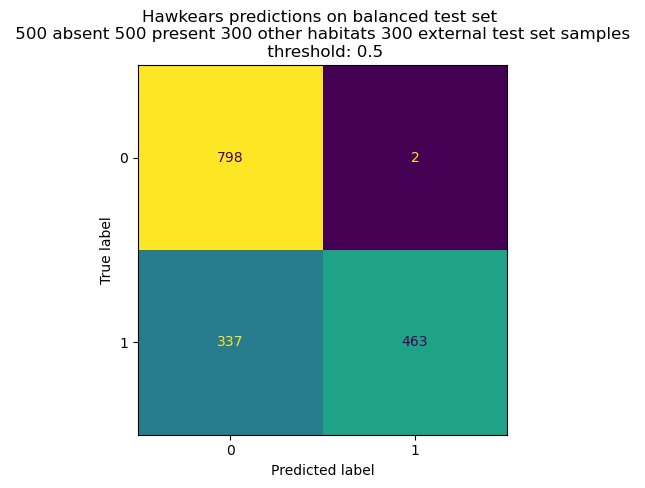

interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0, step=0.01), Output()), _dom_cla…

<function __main__.interactive_confusion_matrix(threshold=0.5)>

In [43]:
title = "Hawkears predictions on balanced test set \n 500 absent 500 present 300 other habitats 300 external test set samples"
cm = plot_confusion_matrix(test_df,hawkears_df,threshold=0.5, title=title)
def interactive_confusion_matrix(threshold=0.5):
    cm = plot_confusion_matrix(test_df,hawkears_df,threshold=threshold, title=title)
interact(interactive_confusion_matrix, threshold=(0,1,0.01))

In [44]:
preds, targets, scores = get_binary_targets_scores(test_df, hawkears_df, 0.5)
hawkears_scores_and_targets_df = pd.DataFrame({'hawkears_scores': scores, 'targets': targets})
hawkears_scores_and_targets_df.head()

,hawkears_scores,targets
0,0.94,1.0
1,0.94,1.0
2,0.97,1.0
3,0.97,1.0
4,0.93,1.0


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


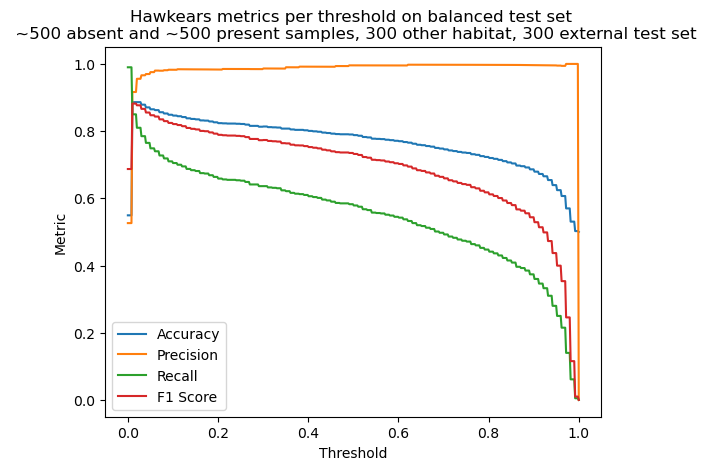

In [45]:
title = "Hawkears metrics per threshold on balanced test set \n ~500 absent and ~500 present samples, 300 other habitat, 300 external test set"
data, names = plot_metrics_across_thresholds(hawkears_scores_and_targets_df, 'hawkears_scores', 'targets', title=title)

In [46]:
# Find the threshold at which F1 score is maximized
names.insert(0, 'threshold')
df = pd.DataFrame(data,columns=[names])
df.loc[df["F1 Score"].idxmax()]

,threshold,Accuracy,Precision,Recall,F1 Score
5,tensor(0.0100),0.88625,0.916442,0.85,0.881971


In [47]:
thresh = df.loc[df["F1 Score"].idxmax()].threshold.values[0][0].item()
thresh

0.010020039975643158

In [48]:
hawkears_df.rename(columns={"target_present": "hawkears_confidence"}, inplace=True)
hawkears_df.head()

,file_id,start_time,end_time,species,hawkears_confidence
0,0,0.00,3.00,OSFL,0.94
1,1,0.00,3.00,OSFL,0.94
2,2,0.00,3.00,OSFL,0.97
3,3,0.00,3.00,OSFL,0.97
4,4,0.00,3.00,OSFL,0.93


In [49]:
test_df.columns

Index(['recording_url', 'task_method', 'project', 'detection_time',
       'tag_duration', 'latitude', 'longitude', 'file_type', 'media_url',
       'individual_order', 'location_id', 'filename', 'target_present',
       'target_absent', 'predicted', 'loss', 'confidence_cat', 'source',
       'organization', 'project_id', 'location', 'location_buffer_m',
       'equipment_make', 'equipment_model', 'recording_id',
       'recording_date_time', 'task_id', 'aru_task_status', 'task_duration',
       'species_code', 'species_common_name', 'species_scientific_name',
       'tag_id', 'individual_count', 'vocalization', 'rms_peak_dbfs',
       'tag_is_verified', 'tag_rating', 'observer', 'observer_id',
       'species_individual_comments', 'task_comments', 'wildtrax_url',
       'target', 'path', 'prediction', 'file_ID'],
      dtype='object')

In [50]:
test_df.rename(columns={"file_ID": "file_id"}, inplace=True)

# Add hawkears preds on the balanced test set to the test df

In [51]:
test_df["hawkears_confidence"] = hawkears_df["hawkears_confidence"].values
test_df.head(2)

recording_url  \
file                                               start_time end_time                                                      
../../data/raw/recordings/OSFL/recording-50028.... 12.0       15.0      https://wildtrax-aru.s3.us-west-2.amazonaws.co...   
                                                   63.0       66.0      https://wildtrax-aru.s3.us-west-2.amazonaws.co...   

                                                                       task_method  \
file                                               start_time end_time               
../../data/raw/recordings/OSFL/recording-50028.... 12.0       15.0            1SPM   
                                                   63.0       66.0            1SPM   

                                                                                                    project  \
file                                               start_time end_time                                        
../../data/raw/recordings/OSFL/recording-50028.... 12.0       15.0      Boreal Wetland Community Monitoring   
                                                   63.0       66.0      Boreal Wetland Community Monitoring   

                                                                               detection_time  \
file                                               start_time end_time                          
../../data/raw/recordings/OSFL/recording-50028.... 12.0       15.0      [12.2, 63.13, 122.71]   
                                                   63.0       66.0      [12.2, 63.13, 122.71]   

                                                                              tag_duration  \
file                                               start_time end_time                       
../../data/raw/recordings/OSFL/recording-50028.... 12.0       15.0      [1.55, 1.39, 1.48]   
                                                   63.0       66.0      [1.55, 1.39, 1.48]   

                                                                         latitude  \
file                                               start_time end_time              
../../data/raw/recordings/OSFL/recording-50028.... 12.0       15.0      57.363503   
                                                   63.0       66.0      57.363503   

                                                                        longitude  \
file                                               start_time end_time              
../../data/raw/recordings/OSFL/recording-50028.... 12.0       15.0      -111.2399   
                                                   63.0       66.0      -111.2399   

                                                                       file_type  \
file                                               start_time end_time             
../../data/raw/recordings/OSFL/recording-50028.... 12.0       15.0          flac   
                                                   63.0       66.0          flac   

                                                                                                                media_url  \
file                                               start_time end_time                                                      
../../data/raw/recordings/OSFL/recording-50028.... 12.0       15.0      https://portal.wildtrax.ca/home/aru-tasks/reco...   
                                                   63.0       66.0      https://portal.wildtrax.ca/home/aru-tasks/reco...   

                                                                       individual_order  \
file                                               start_time end_time                    
../../data/raw/recordings/OSFL/recording-50028.... 12.0       15.0                  1.0   
                                                   63.0       66.0                  1.0   

                                                                        ...  \
file                                               start_time end_time  ...   
../../da

# Calculate the false positives and false negatives when hawkears is tested against the same test set at the threshold which gives the best F1 score.

In [52]:
hawkears_false_positives = test_df.loc[test_df['hawkears_confidence'] > thresh].loc[test_df['target_present'] == 0.0]
hawkears_false_negatives = test_df.loc[test_df['hawkears_confidence'] < thresh].loc[test_df['target_present'] == 1.0]
print(f"{len(hawkears_false_positives)} false positives")
print(f"{len(hawkears_false_negatives)} false negatives")
print(f"Threshold chosen = {thresh}")


62 false positives
120 false negatives
Threshold chosen = 0.010020039975643158


In [53]:
# If the false positive and false negatives have been inspected already load them from disk
if Path.exists(data_path / "interim" / "test_set" / "hawkears_false_negative_comments.pkl"):
    hawkears_false_negatives = pd.read_pickle(data_path / "interim" / "test_set" / "hawkears_false_negative_comments.pkl")
if Path.exists(data_path / "interim" / "test_set" / "hawkears_false_positive_comments.pkl"):
    hawkears_false_positives = pd.read_pickle(data_path / "interim" / "test_set" / "hawkears_false_positive_comments.pkl")

In [54]:
# hawkears_false_positives.rename(columns={"false_positive_description": "false_positive_comments"}, inplace=True)
# hawkears_false_negatives.rename(columns={"false_negative_description": "false_negative_comments"}, inplace=True)

# Inspect the hawkears false negatives

All comments have been added, showing a sample.


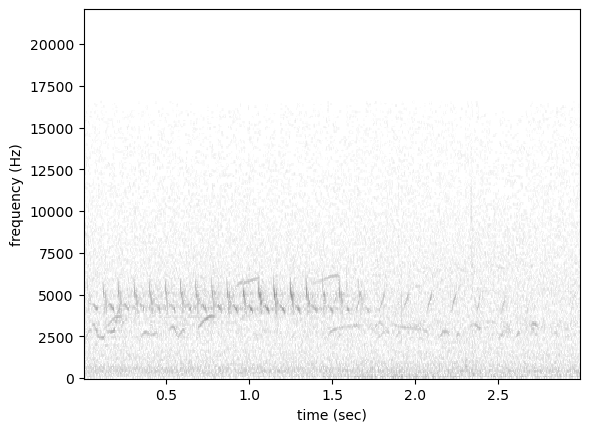

Comment: other species present


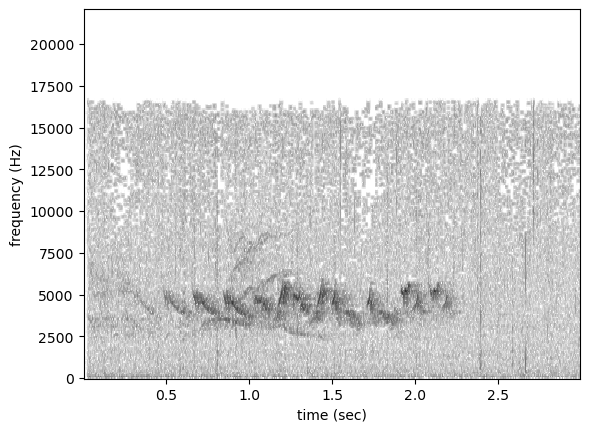

Comment: masked, rain, reverb


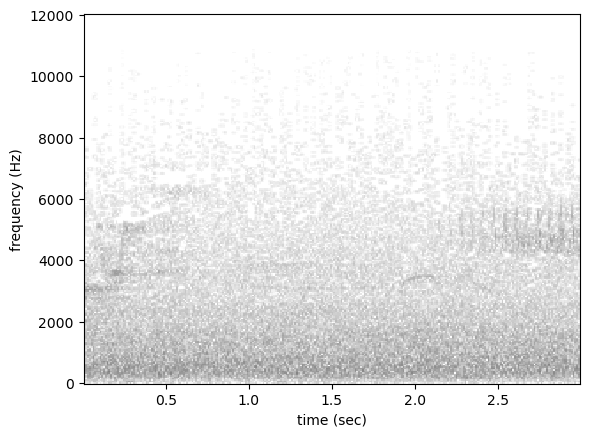

Comment: distant and noise


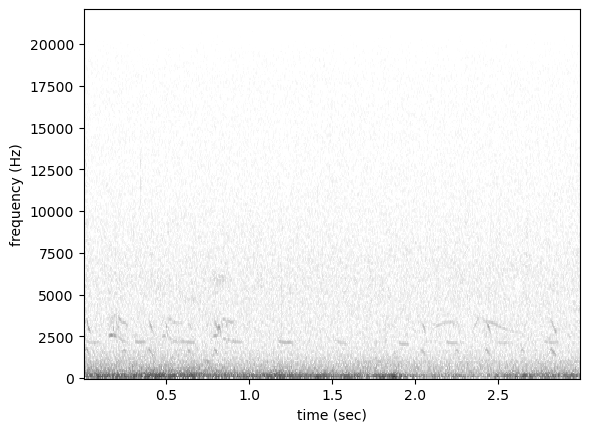

Comment: distant


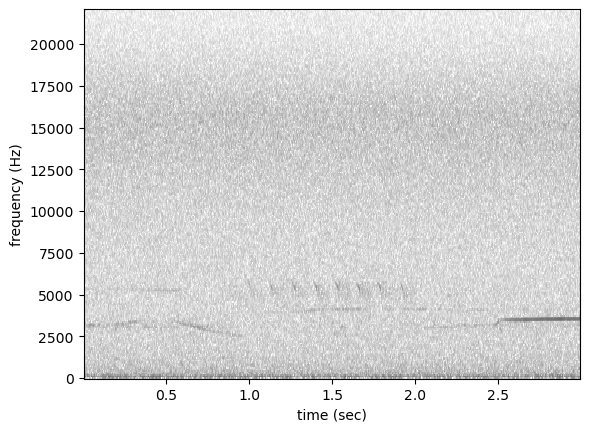

Comment: distant, noise


In [55]:
inspect_wrong_predictions(hawkears_false_negatives, "false_negative_comments")

In [56]:
hawkears_false_negatives.false_negative_comments.value_counts()

false_negative_comments
distant                                                    43
masked                                                     18
other species present                                       8
distant, masked                                             3
machine noise                                               3
distant and other species present                           3
clear                                                       2
rain and masked                                             2
masked, noise                                               2
bass noise                                                  2
distant and noisy                                           2
noise                                                       2
distant, noise                                              2
possible absent or similar species masked                   1
distant, tree creak                                         1
distant and machine noise                     

# Inspect the hawkears false positives

All comments have been added, showing a sample.


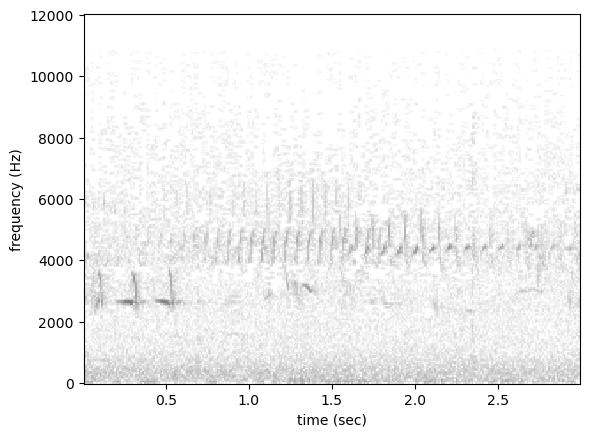

Comment: other birds


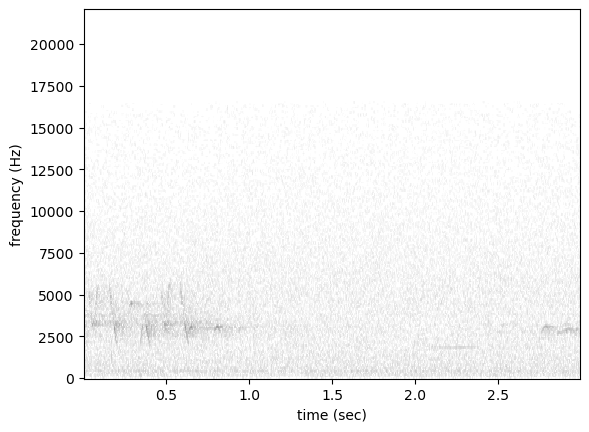

Comment: other bird


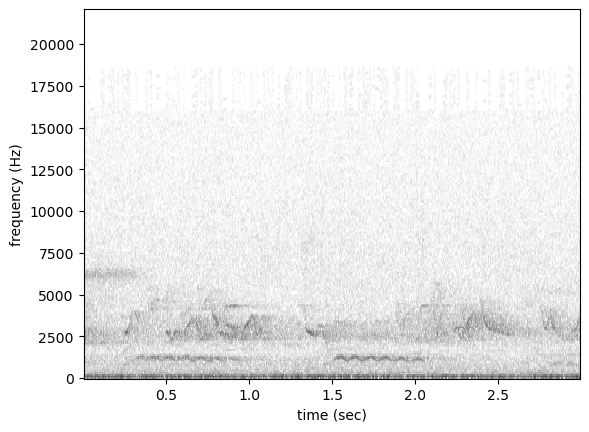

Comment: other bird


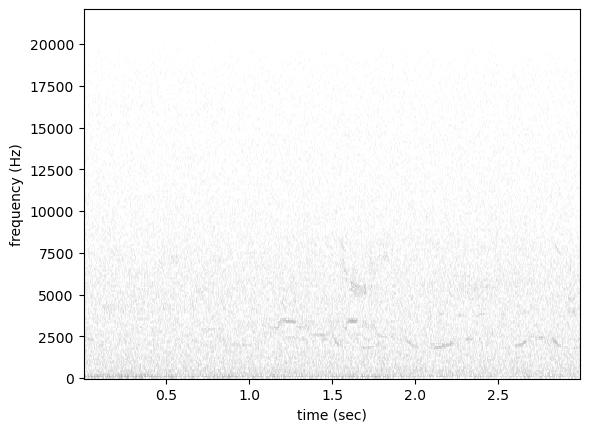

Comment: other bird


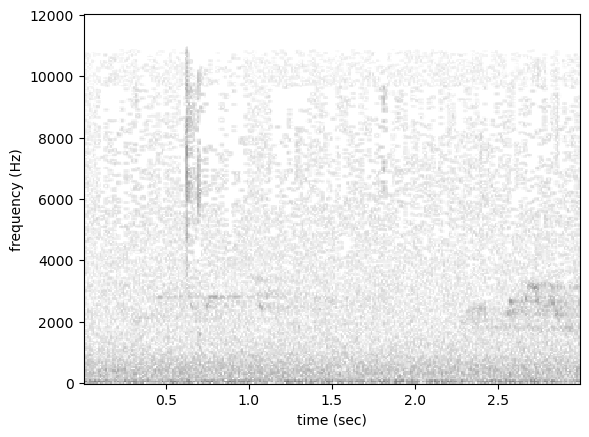

Comment: other bird


In [57]:
inspect_wrong_predictions(hawkears_false_positives, comments_col_name = "false_positive_comments")

In [58]:
# Save the user added comments
hawkears_false_negatives.to_pickle(data_path / "interim" / "test_set" / "hawkears_false_negative_comments.pkl")
hawkears_false_positives.to_pickle(data_path / "interim" / "test_set" / "hawkears_false_positive_comments.pkl")

# Try against an un-cleaned test set

# To make sure we're not biasing things too much during dataset cleaning, we can try a direct comparison of the models before any cleaning has taken place. 

In [59]:
test_set_uncleaned = pd.read_pickle(data_path / "interim" / "test_set" / "test_set.pkl")
present_uncleaned = test_set_uncleaned.loc[test_set_uncleaned.target_present == 1.0].sample(500, random_state=42)
absent_uncleaned = test_set_uncleaned.loc[test_set_uncleaned.target_present == 0.0].sample(500, random_state=42)
balanced_uncleaned_df = pd.concat([present_uncleaned, absent_uncleaned]).sample(frac=1, random_state=42)

unbiased_predictions = model.predict(balanced_uncleaned_df[["target_present"]], batch_size=64, num_workers=0, activation_layer='sigmoid')
balanced_uncleaned_df["predicted"] = unbiased_predictions.target_present


  0%|          | 0/16 [00:00<?, ?it/s]

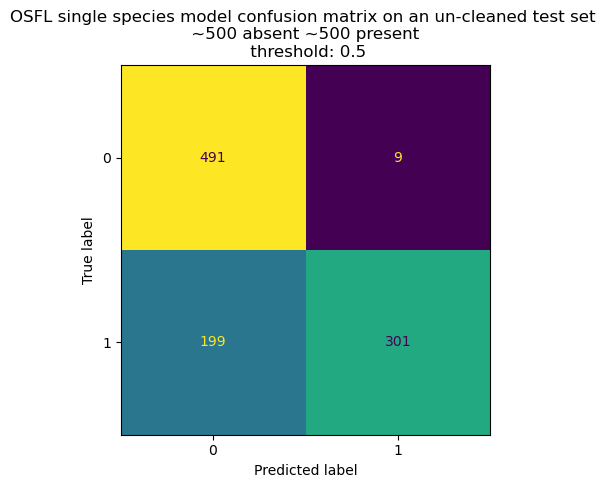

interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0, step=0.01), Output()), _dom_cla…

<function __main__.interactive_confusion_matrix(threshold=0.5)>

In [62]:
title = "OSFL single species model confusion matrix on an un-cleaned test set \n ~500 absent ~500 present"
cm = plot_confusion_matrix(balanced_uncleaned_df,unbiased_predictions,threshold=0.5, title=title)
def interactive_confusion_matrix(threshold=0.5):
    cm = plot_confusion_matrix(balanced_uncleaned_df,unbiased_predictions,threshold=threshold, title=title)
interact(interactive_confusion_matrix, threshold=(0,1,0.01))

# Plot metrics across thresholds

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


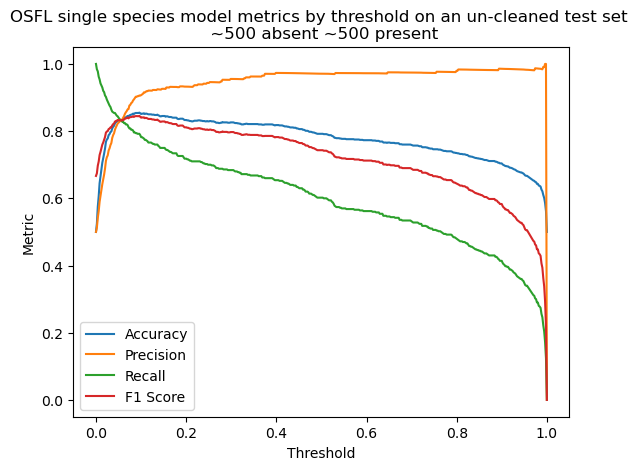

In [61]:
title = "OSFL single species model metrics by threshold on an un-cleaned test set \n ~500 absent ~500 present"
data, names = plot_metrics_across_thresholds(balanced_uncleaned_df, 'predicted', 'target_present', title = title)

# Save unbiased test set to make HawkEars predictions on

# To make hawkears predictions on each clip in the uncleaned test set:
1. Enumerate the clips in the dataset for easier file naming
2. Make the save paths to save the audio to
3. Save the clips to disk
4. Run hawkears on the clips and output to the folder specified by __predictions path__ 
5. Load the predictions ready for processing the metrics

# Ennumerate each clip in the dataset

In [165]:
# Add an integer index to the uncleaned training set to use as a file id
balanced_uncleaned_df["file_id"] = 0
balanced_uncleaned_df.loc[:, 'file_id'] = range(0, len(balanced_uncleaned_df))
balanced_uncleaned_df.loc[:, 'file_id'] = balanced_uncleaned_df['file_id'].astype(int)

In [166]:
# Make a path to save the clips to
save_path = data_path / "processed" / "balanced_uncleaned_test_set" / "clips"
Path.mkdir(save_path, exist_ok=True, parents=True)

# Save the metadata in the same place or load it if there is already a saved version
if Path.exists(save_path.parent / "balanced_uncleaned_test_set.pkl"):
    balanced_uncleaned_df = pd.read_pickle(save_path.parent / "balanced_uncleaned_test_set.pkl")
    print("loading existing metadata")
else: 
    save_dataframe_clips_to_disk(balanced_uncleaned_df, save_path)
    balanced_uncleaned_df.to_pickle(save_path.parent / "balanced_uncleaned_test_set.pkl")
    print("saving metadata")

loading existing metadata


# Make predictions on these clips using HawkEars

``` 
python3 analyze.py -i <path to input clips> -o <path to output results>
```

The output path was chosen as the parent folder of the audio clips. 

In [167]:
# Set the location of hawkears prediction files
predictions_path = save_path.parent / "hawkears"
# Load the file paths
hawkears_files = glob.glob(str(predictions_path / '*.txt'))

In [168]:
# Process the hawkears files into a dataframe.
hawkears_df = hawkears_files_to_df(hawkears_files, target_species="OSFL")
hawkears_df.rename(columns={"confidence": "target_present"}, inplace=True)

In [169]:
hawkears_df.head()

,file_id,start_time,end_time,species,target_present
0,0,0.00,3.00,OSFL,0.01
1,1,0.00,3.00,OSFL,0.01
2,2,0.00,3.00,OSFL,0.01
3,3,0.00,3.00,OSFL,0.01
4,4,0.00,3.00,OSFL,0.84


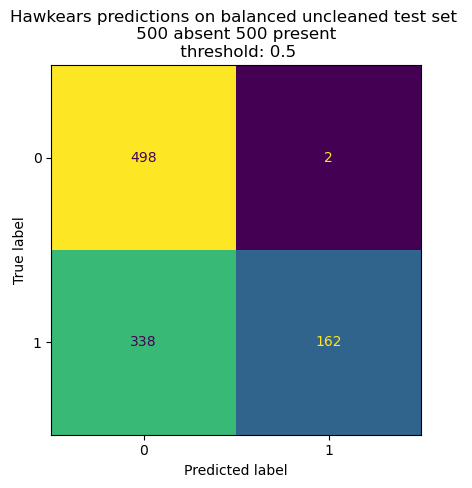

interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0, step=0.01), Output()), _dom_cla…

<function __main__.interactive_confusion_matrix(threshold=0.5)>

In [170]:
title = "Hawkears predictions on balanced uncleaned test set \n 500 absent 500 present"
cm = plot_confusion_matrix(balanced_uncleaned_df,hawkears_df,threshold=0.5, title=title)
def interactive_confusion_matrix(threshold=0.5):
    cm = plot_confusion_matrix(balanced_uncleaned_df,hawkears_df,threshold=threshold, title=title)
interact(interactive_confusion_matrix, threshold=(0,1,0.01))

In [171]:
preds, targets, scores = get_binary_targets_scores(balanced_uncleaned_df, hawkears_df, 0.5)
hawkears_scores_and_targets_df = pd.DataFrame({'hawkears_scores': scores, 'targets': targets})
hawkears_scores_and_targets_df.head()

,hawkears_scores,targets
0,0.01,0.0
1,0.01,0.0
2,0.01,0.0
3,0.01,0.0
4,0.84,1.0


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-

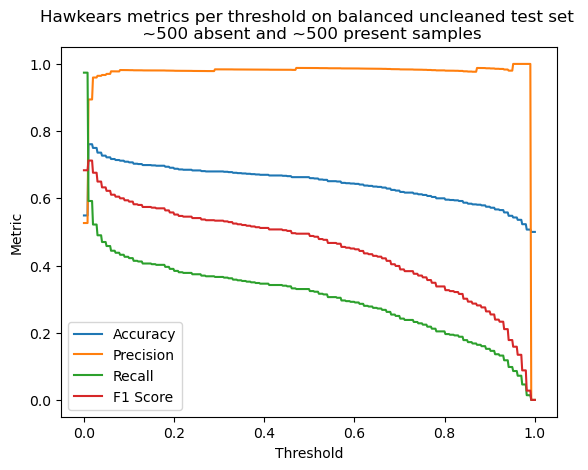

In [172]:
title = "Hawkears metrics per threshold on balanced uncleaned test set \n ~500 absent and ~500 present samples"
data, names = plot_metrics_across_thresholds(hawkears_scores_and_targets_df, 'hawkears_scores', 'targets', title=title)